# 데이터 불러오기

In [133]:
!pip install plotly
!pip install chart_studio
from chart_studio import plotly

In [134]:
# 필요모듈 import
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.offline as pyoff
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode

In [135]:
train_transaction = pd.read_csv('/Users/krc/Desktop/강의자료/kaggle/miniproject_modeling/train_transaction.csv', index_col='TransactionID')
test_transaction = pd.read_csv('/Users/krc/Desktop/강의자료/kaggle/miniproject_modeling/test_transaction.csv', index_col='TransactionID')
train_identity = pd.read_csv('/Users/krc/Desktop/강의자료/kaggle/miniproject_modeling/train_identity.csv', index_col='TransactionID')
test_identity = pd.read_csv('/Users/krc/Desktop/강의자료/kaggle/miniproject_modeling/test_identity.csv', index_col='TransactionID')

In [136]:
train_transaction.head() 

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [137]:
train_identity.head()

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


# 전처리
결측치 제거

## train_transaction
Not all transactions have corresponding identity information

In [138]:
missing_values_count = train_transaction.isnull().sum()
print (missing_values_count[0:10])
total_cells = np.product(train_transaction.shape)
total_missing = missing_values_count.sum()
print ("% of missing data = ",(total_missing/total_cells) * 100)

isFraud              0
TransactionDT        0
TransactionAmt       0
ProductCD            0
card1                0
card2             8933
card3             1565
card4             1577
card5             4259
card6             1571
dtype: int64
% of missing data =  41.17794374769424


In [139]:
del missing_values_count, total_cells, total_missing

메모리  조정

## train_identity

In [140]:
missing_values_count = train_identity.isnull().sum()
print (missing_values_count[0:10])
total_cells = np.product(train_identity.shape)
total_missing = missing_values_count.sum()
print ("% of missing data = ",(total_missing/total_cells) * 100)

id_01         0
id_02      3361
id_03     77909
id_04     77909
id_05      7368
id_06      7368
id_07    139078
id_08    139078
id_09     69307
id_10     69307
dtype: int64
% of missing data =  36.47062392101669


In [141]:
del missing_values_count, total_cells, total_missing

## fraud의 imbalance 확인
Notice how imbalanced is our original dataset! Most of the transactions are non-fraud. If we use this dataframe as the base for our predictive models and analysis we might get a lot of errors and our algorithms will probably overfit since it will "assume" that most transactions are not fraud. But we don't want our model to assume, we want our model to detect patterns that give signs of fraud!

대부분 자료가 non-fraud에 해당되어서 모델이 non-fraund라고 assume 해버리는 overfitting 상태가 염려됨

In [142]:
x = train_transaction['isFraud'].value_counts().index
y = train_transaction['isFraud'].value_counts().values

trace2 = go.Bar(
     x=x ,
     y=y,
     marker=dict(
         color=y,
         colorscale = 'Viridis',
         reversescale = True
     ),
     name="Imbalance",    
 )
layout = dict(
     title="Data imbalance - isFraud",
     #width = 900, height = 500,
     xaxis=go.layout.XAxis(
     automargin=True),
     yaxis=dict(
         showgrid=False,
         showline=False,
         showticklabels=True,
 #         domain=[0, 0.85],
     ), 
)
fig1 = go.Figure(data=[trace2], layout=layout)
iplot(fig1)

메모리 최적화

In [143]:
import gc
gc.enable()

In [144]:
del x,y
gc.collect()

2873

## DateTime 처리
The TransactionDT feature is a timedelta from a given reference datetime (not an actual timestamp).

real timestamp가 아닌 상대적인 timestamp이다. 'delta'임!

게다가 시간의 단위는 second로 합리적 추론 가능

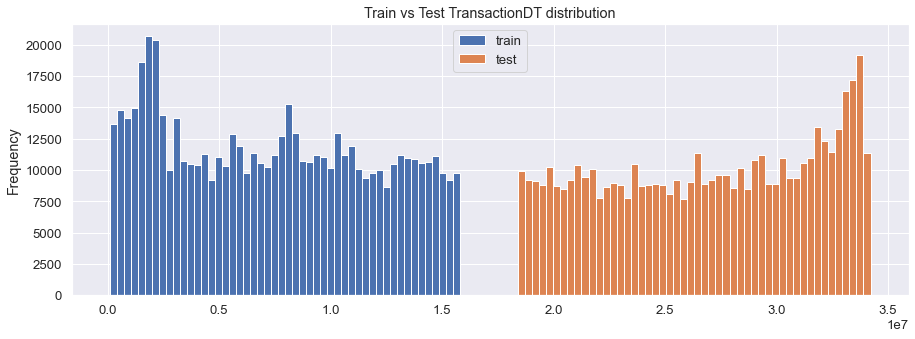

In [145]:
train_transaction['TransactionDT'].plot(kind='hist',
                                        figsize=(15, 5),
                                        label='train',
                                        bins=50,
                                        title='Train vs Test TransactionDT distribution')
test_transaction['TransactionDT'].plot(kind='hist',
                                       label='test',
                                       bins=50)
plt.legend()
plt.show()

As you can see it seems that train and test transaction dates don't overlap, so it would be prudent to use time-based split for validation. 

Also we can see the '30 days gap' between train and test.

“TransactionDT first value is 86400, which corresponds to the number of seconds in a day (60 * 60 * 24 = 86400) so I think the unit is seconds. Using this, we know the data spans 6 months, as the maximum value is 15811131, which would correspond to day 183.”

## isFraund와 시간의 상관관계 확인

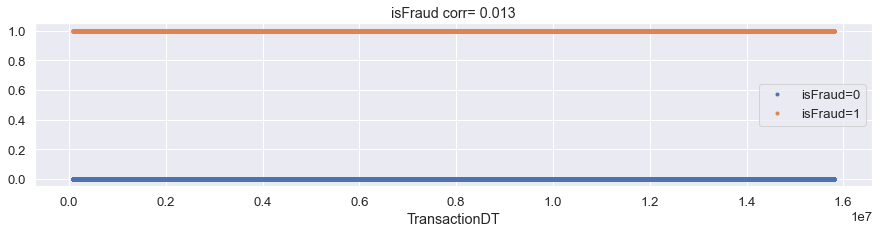

In [146]:
i = 'isFraud'
cor = np.corrcoef(train_transaction['TransactionDT'], train_transaction[i])[0,1]
train_transaction.loc[train_transaction['isFraud'] == 0].set_index('TransactionDT')[i].plot(style='.', title=i+" corr= "+str(round(cor,3)), figsize=(15, 3), label="isFraud=0")
train_transaction.loc[train_transaction['isFraud'] == 1].set_index('TransactionDT')[i].plot(style='.', title=i+" corr= "+str(round(cor,3)), figsize=(15, 3), label="isFraud=1")
#test_transaction.set_index('TransactionDT')[i].plot(style='.', title=i+" corr= "+str(round(cor,3)), figsize=(15, 3))
plt.legend()
plt.show()

# Feature 데이터
## C_number

C1-C14: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.
“Can you please give more examples of counts in the variables C1-15? Would these be like counts of phone numbers, email addresses, names associated with the user? I can't think of 15.
Your guess is good, plus like device, ipaddr, billingaddr, etc. Also these are for both purchaser and recipient, which doubles the number.”

그냥 세상의 모든 address 다 붙인듯?
전화번호, MAC_address,결제하는 곳 address, 구매자 address, 수령자 address
엄마가 california에서 여행하면서 ipad로 서울 집에 있는 아들한태 보낼 물건을 쿠팡으로 산다. 한국 엄마의 집은 대전이다.
여튼 거래와 관련된 주소(?) 다 때려박고 feature 데이터로 사용

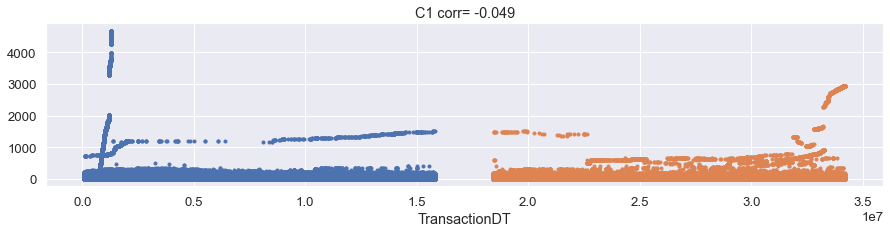

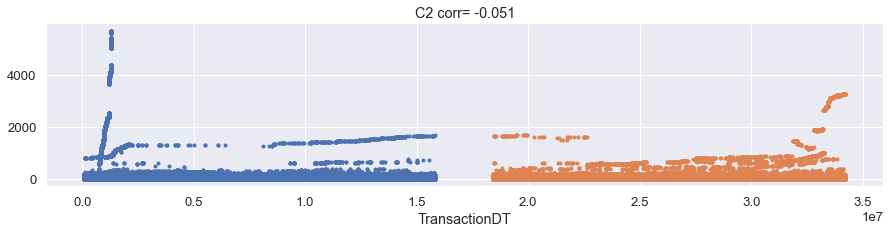

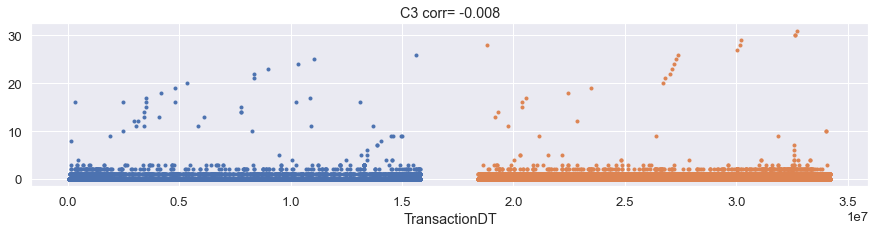

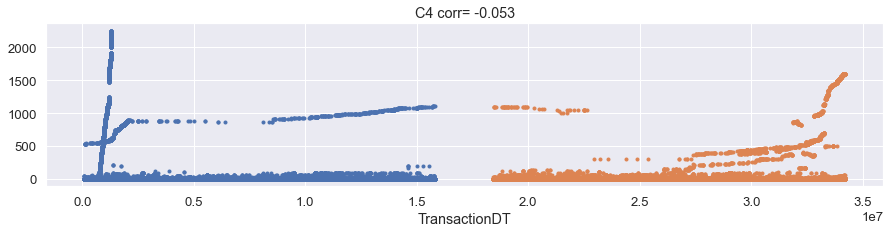

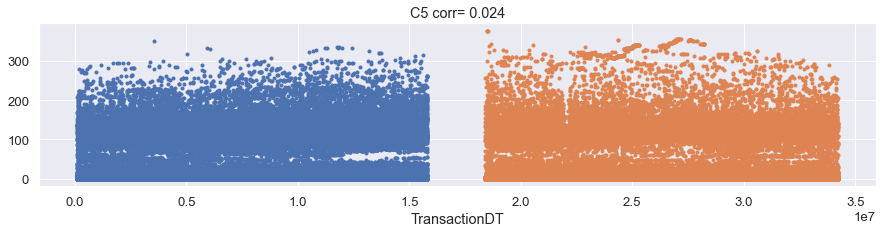

...

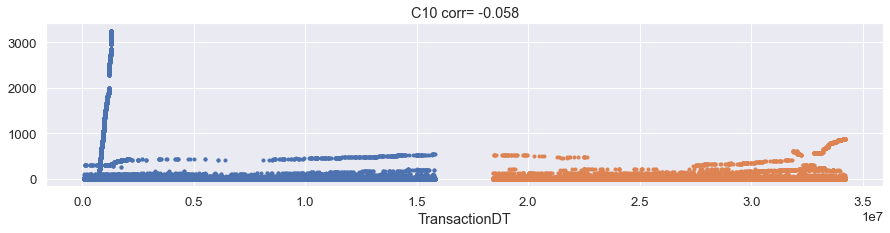

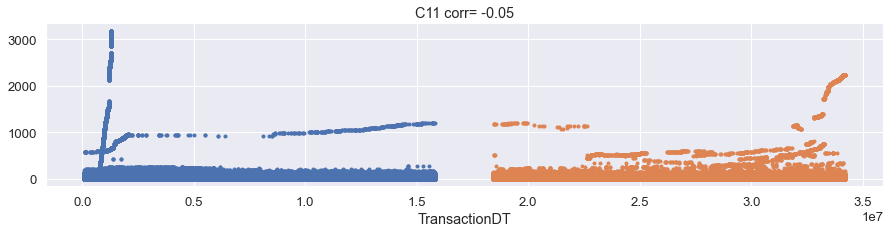

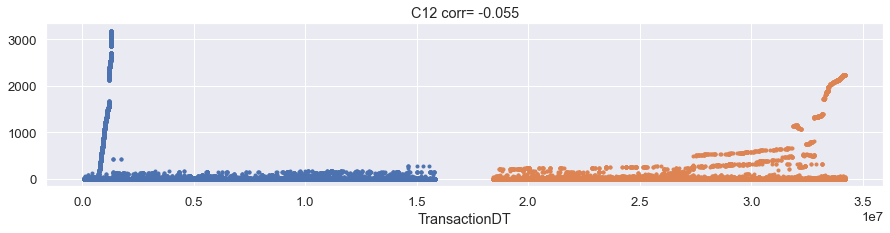

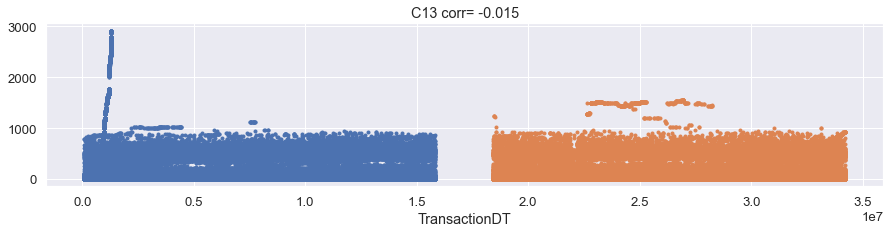

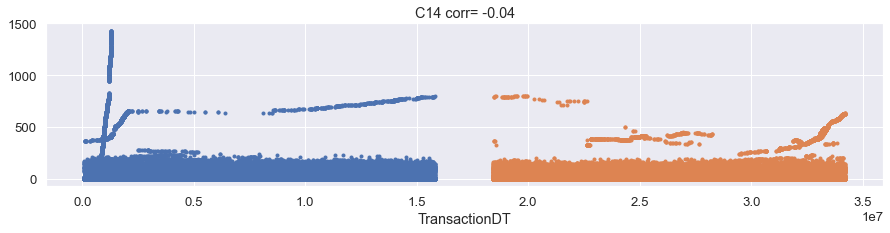

In [147]:
c_features = list(train_transaction.columns[16:30])
for i in c_features:
    cor = np.corrcoef(train_transaction['TransactionDT'], train_transaction[i])[0,1]
    train_transaction.set_index('TransactionDT')[i].plot(style='.', title=i+" corr= "+str(round(cor,3)), figsize=(15, 3))
    test_transaction.set_index('TransactionDT')[i].plot(style='.', title=i+" corr= "+str(round(cor,3)), figsize=(15, 3))
    plt.show()

In [148]:
del c_features
gc.collect()

56106

## D_number

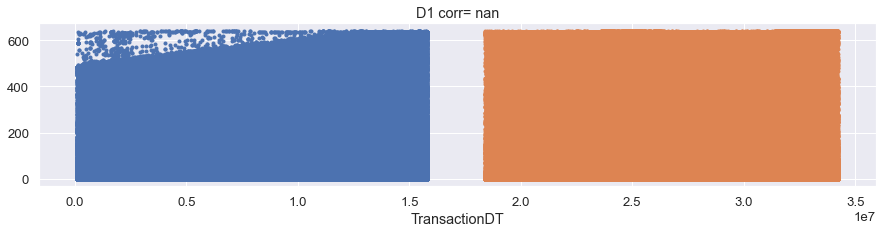

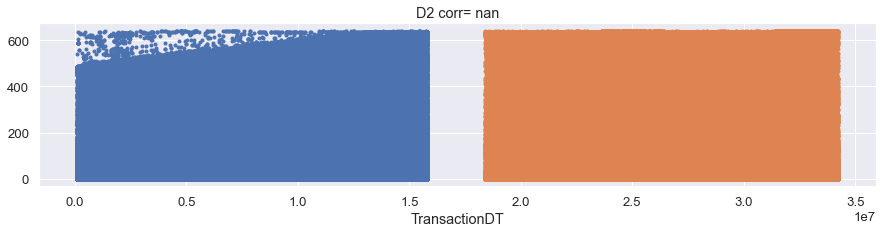

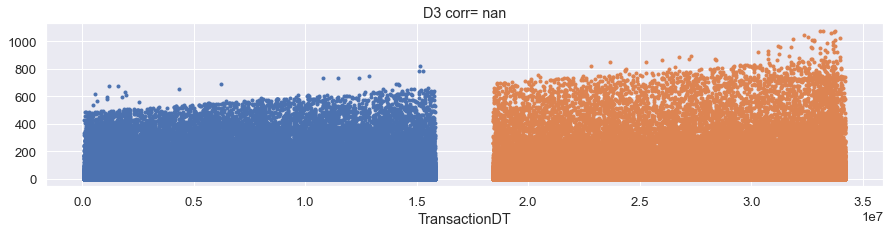

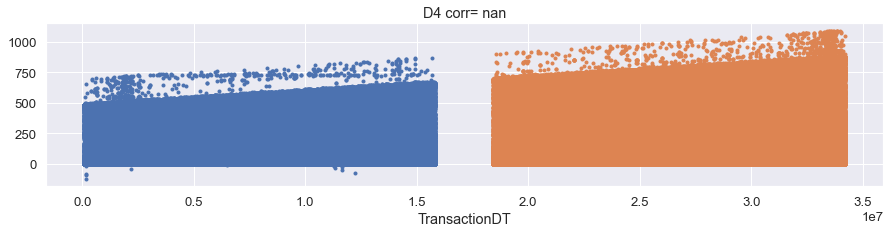

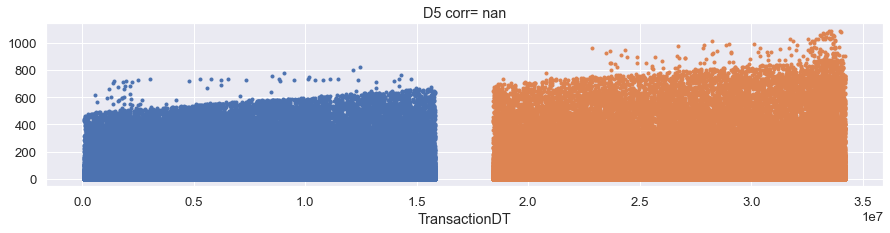

...

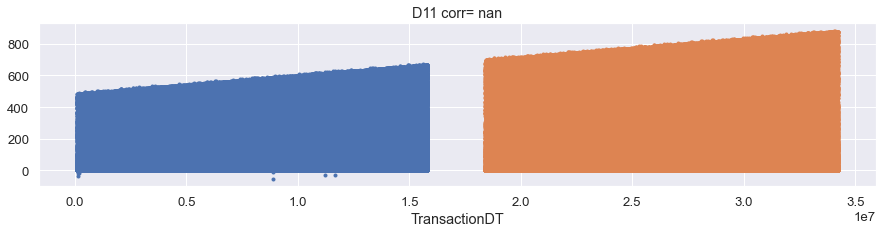

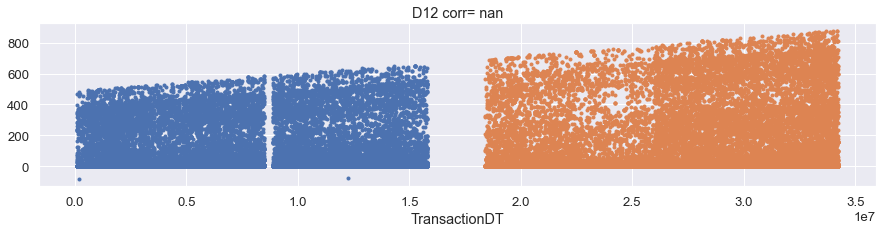

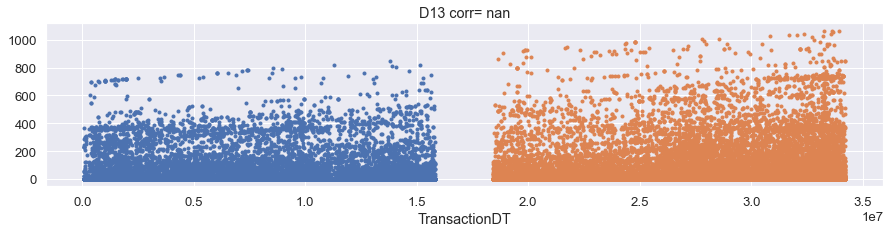

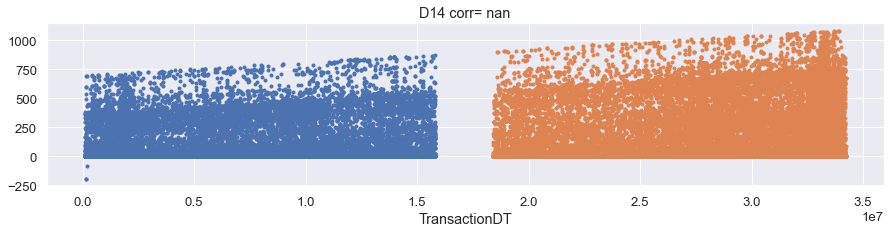

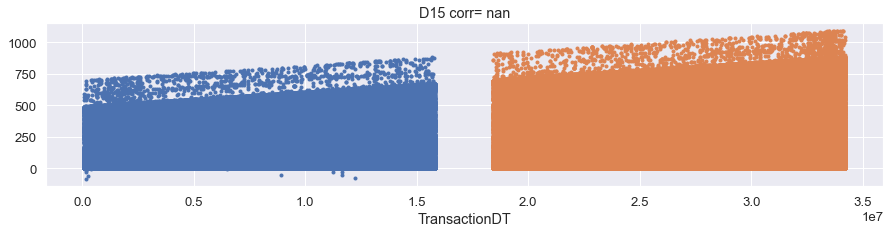

In [149]:
d_features = list(train_transaction.columns[30:45])

for i in d_features:
    cor = np.corrcoef(train_transaction['TransactionDT'], train_transaction[i])[0,1]
    train_transaction.set_index('TransactionDT')[i].plot(style='.', title=i+" corr= "+str(round(cor,3)), figsize=(15, 3))
    test_transaction.set_index('TransactionDT')[i].plot(style='.', title=i+" corr= "+str(round(cor,3)), figsize=(15, 3))
    plt.show()

D-number 들은 Nan값이 많다. 문제가 많네요

In [150]:
train_transaction[d_features].head()

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
TransactionID,,,,,,,,,,,,,,,
2987000,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0
2987001,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0
2987002,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0
2987003,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0
2987004,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


와~ 정말 결측치가 많군요?

In [151]:
missing_values_count = train_transaction[d_features].isnull().sum()
missing_values_count

D1       1269
D2     280797
D3     262878
D4     168922
D5     309841
D6     517353
D7     551623
D8     515614
D9     515614
D10     76022
D11    279287
D12    525823
D13    528588
D14    528353
D15     89113
dtype: int64

무려 58%가 결측치

In [152]:
# how many total missing values do we have?
total_cells = np.product(train_transaction[d_features].shape)
total_missing = missing_values_count.sum()
# percent of data that is missing
(total_missing/total_cells) * 100

58.15126268612908

결측치를 '-1'로 채워서 해보겠습니다. 
(train, test) 둘다 함

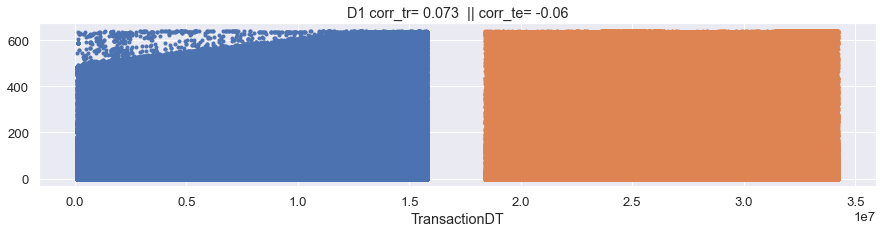

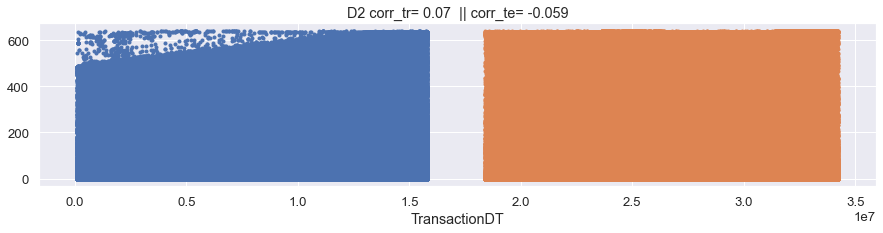

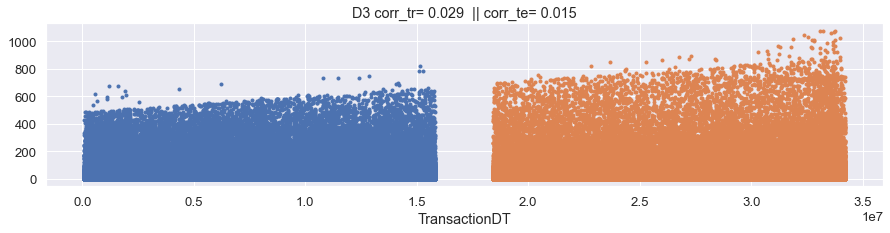

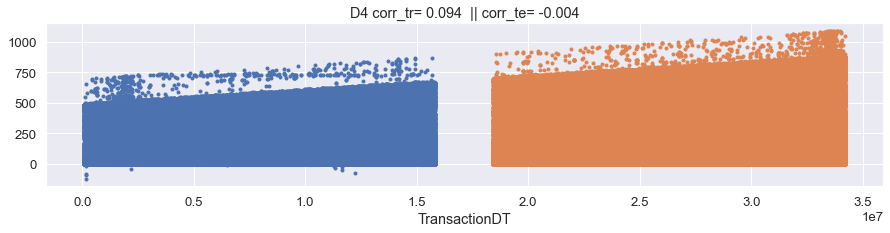

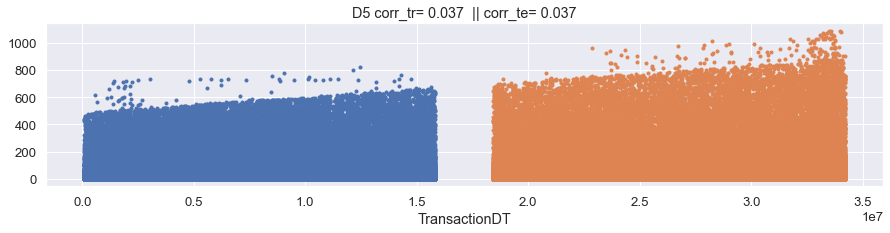

...

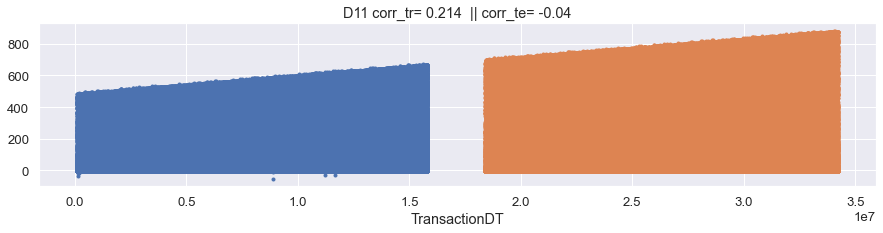

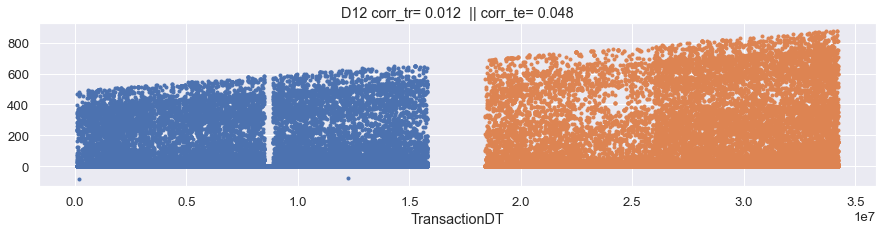

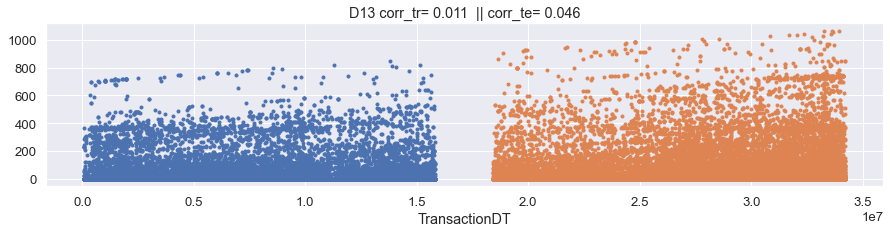

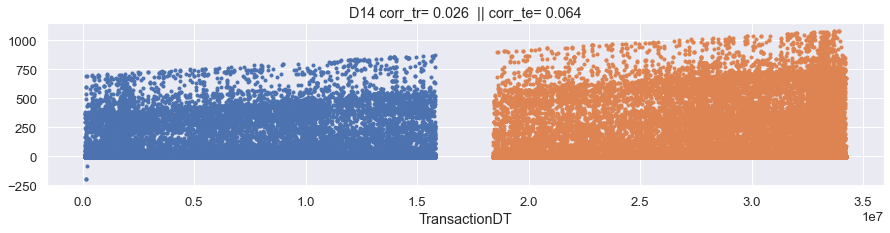

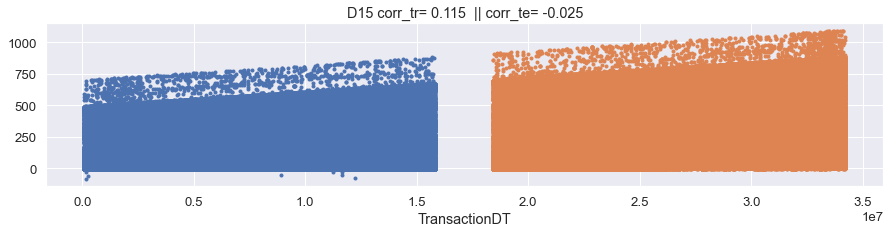

In [153]:
for i in d_features:
    cor_tr = np.corrcoef(train_transaction['TransactionDT'], train_transaction[i].fillna(-1))[0,1]
    cor_te = np.corrcoef(test_transaction['TransactionDT'], test_transaction[i].fillna(-1))[0,1]
    train_transaction.set_index('TransactionDT')[i].fillna(-1).plot(style='.', title=i+" corr_tr= "+str(round(cor_tr,3))+" || corr_te= "+str(round(cor_te,3)), figsize=(15, 3))
    test_transaction.set_index('TransactionDT')[i].fillna(-1).plot(style='.', title=i+" corr_tr= "+str(round(cor_tr,3))+"  || corr_te= "+str(round(cor_te,3)), figsize=(15, 3))
    plt.show()

이제 상관계수 제대로 나옴

In [154]:
del d_features, cor
gc.collect()

95002

메모리 최적화

## M-number

M1-M9: match, such as names on card and address, etc.
M은 Matching임. True/False의 value를 가짐

In [155]:
m_features = list(train_transaction.columns[45:54])
train_transaction[m_features].head()

,M1,M2,M3,M4,M5,M6,M7,M8,M9
TransactionID,,,,,,,,,
2987000,T,T,T,M2,F,T,NaN,NaN,NaN
2987001,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN
2987002,T,T,T,M0,F,F,F,F,F
2987003,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN
2987004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## V-number (V-150은 Feature로)

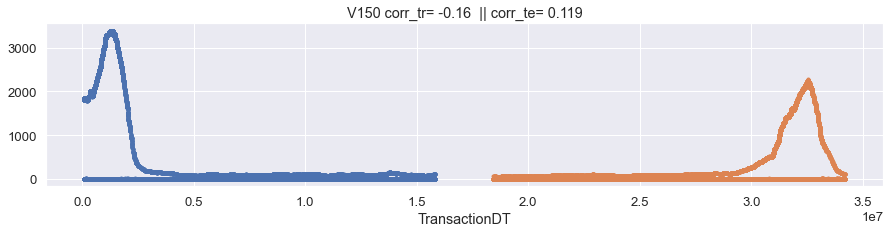

In [156]:
i = "V150"
cor_tr = np.corrcoef(train_transaction['TransactionDT'], train_transaction[i].fillna(-1))[0,1]
cor_te = np.corrcoef(test_transaction['TransactionDT'], test_transaction[i].fillna(-1))[0,1]
train_transaction.set_index('TransactionDT')[i].fillna(-1).plot(style='.', title=i+" corr_tr= "+str(round(cor_tr,3))+" || corr_te= "+str(round(cor_te,3)), figsize=(15, 3))
test_transaction.set_index('TransactionDT')[i].fillna(-1).plot(style='.', title=i+" corr_tr= "+str(round(cor_tr,3))+"  || corr_te= "+str(round(cor_te,3)), figsize=(15, 3))
plt.show()

Vxxx: Vesta engineered rich features, including ranking, counting, and other entity relations.
“For example, how "many times" the payment card associated with a IP and email or address appeared in 24 hours time range, etc.”
"All Vesta features were derived as numerical. some of them are count of orders within a clustering, a time-period or condition, so the value is finite and has ordering (or ranking). I wouldn't recommend to treat any of them as categorical. If any of them resulted in binary by chance, it maybe worth trying."

In [157]:
train_transaction.loc[:,train_transaction.columns[train_transaction.columns.str.startswith('V')]].isnull().sum().head(20)

V1     279287
V2     279287
V3     279287
V4     279287
V5     279287
V6     279287
V7     279287
V8     279287
V9     279287
V10    279287
V11    279287
V12     76073
V13     76073
V14     76073
V15     76073
V16     76073
V17     76073
V18     76073
V19     76073
V20     76073
dtype: int64

Null 값도 많고 (In my opinion 애초에 이 데이터들끼리 상관관계도 많고 복잡함. 다중공산성 생각했을 때 제거하는 것이 맞는 듯)

## 거래액 분포

/Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



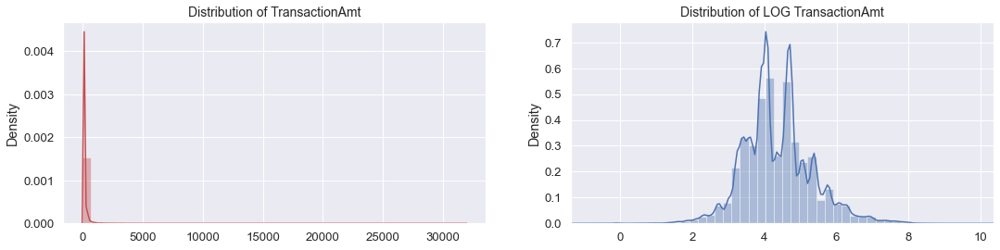

In [158]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

time_val = train_transaction['TransactionAmt'].values

sns.distplot(time_val, ax=ax[0], color='r')
ax[0].set_title('Distribution of TransactionAmt', fontsize=14)
ax[1].set_xlim([min(time_val), max(time_val)])

sns.distplot(np.log(time_val), ax=ax[1], color='b')
ax[1].set_title('Distribution of LOG TransactionAmt', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])

plt.show()

로그 취하니까 분포가 좀 예쁘군요

### isFraud에 따라 구분

/Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



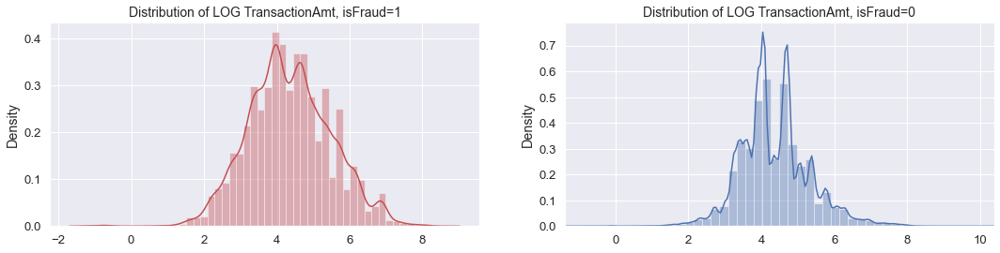

In [159]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

time_val = train_transaction.loc[train_transaction['isFraud'] == 1]['TransactionAmt'].values

sns.distplot(np.log(time_val), ax=ax[0], color='r')
ax[0].set_title('Distribution of LOG TransactionAmt, isFraud=1', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])

time_val = train_transaction.loc[train_transaction['isFraud'] == 0]['TransactionAmt'].values

sns.distplot(np.log(time_val), ax=ax[1], color='b')
ax[1].set_title('Distribution of LOG TransactionAmt, isFraud=0', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])


plt.show()

메모리 최적화

In [160]:
del time_val

그림 그리는 함수 선언

In [161]:
import plotly.figure_factory as ff

In [162]:
def plot_distribution(df, var_select=None, title=None, bins=1.0): 
    # Calculate the correlation coefficient between the new variable and the target
    tmp_fraud = df[df['isFraud'] == 1]
    tmp_no_fraud = df[df['isFraud'] == 0]    
    corr = df['isFraud'].corr(df[var_select])
    corr = np.round(corr,3)
    tmp1 = tmp_fraud[var_select].dropna()
    tmp2 = tmp_no_fraud[var_select].dropna()
    hist_data = [tmp1, tmp2]
    
    group_labels = ['Fraud', 'No Fraud']
    colors = ['seagreen','indianred', ]

    fig = ff.create_distplot(hist_data,
                             group_labels,
                             colors = colors, 
                             show_hist = True,
                             curve_type='kde', 
                             bin_size = bins
                            )
    
    fig['layout'].update(title = title+' '+'(corr target ='+ str(corr)+')')

    iplot(fig, filename = 'Density plot')

In [163]:
tmp = train_transaction[['TransactionAmt', 'isFraud']][0:100000]
plot_distribution(tmp[(tmp['TransactionAmt'] <= 800)], 'TransactionAmt', 'Transaction Amount Distribution', bins=10.0,)

이게 분포 보면 알겠지만 TransactionAmt가 800넘어가면 극소수임 99% 넘어감

In [164]:
tmp.describe()

,TransactionAmt,isFraud
count,100000.000000,100000.00000
mean,130.743351,0.02561
std,206.024684,0.15797
min,0.292000,0.00000
25%,45.000000,0.00000
50%,75.000000,0.00000
75%,135.950000,0.00000
max,4829.950000,1.00000


메모리 최적화

In [165]:
del tmp

# Feature 데이터 Unique 값 확인
## D feafures

/Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



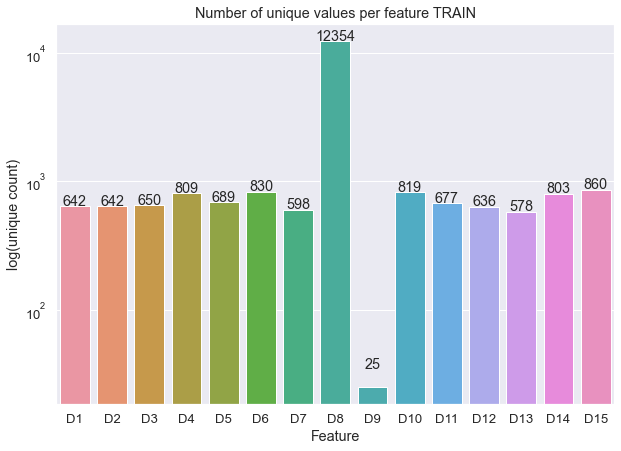

In [166]:
plt.figure(figsize=(10, 7))
d_features = list(train_transaction.columns[30:45])
uniques = [len(train_transaction[col].unique()) for col in d_features]
sns.set(font_scale=1.2)
ax = sns.barplot(d_features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='log(unique count)', title='Number of unique values per feature TRAIN')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center") 
    # train

/Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



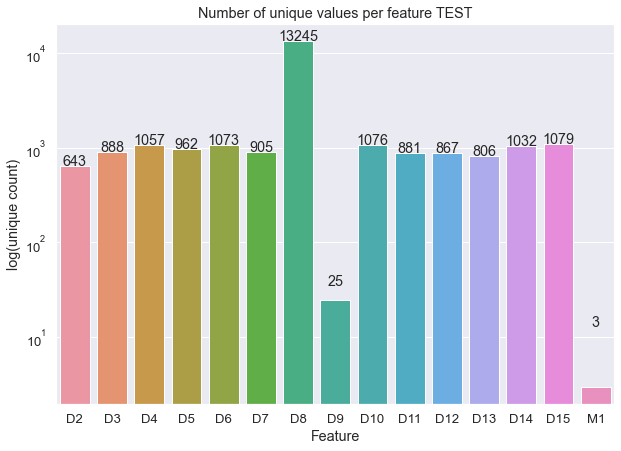

In [167]:
plt.figure(figsize=(10, 7))
d_features = list(test_transaction.columns[30:45])
uniques = [len(test_transaction[col].unique()) for col in d_features]
sns.set(font_scale=1.2)
ax = sns.barplot(d_features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='log(unique count)', title='Number of unique values per feature TEST')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center") 
    # test

## C-features

/Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



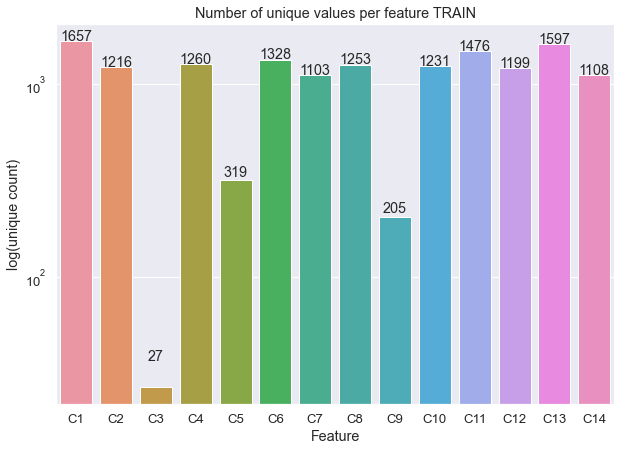

In [168]:
plt.figure(figsize=(10, 7))
c_features = list(train_transaction.columns[16:30])
uniques = [len(train_transaction[col].unique()) for col in c_features]
sns.set(font_scale=1.2)
ax = sns.barplot(c_features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='log(unique count)', title='Number of unique values per feature TRAIN')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center") 
    #train

/Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



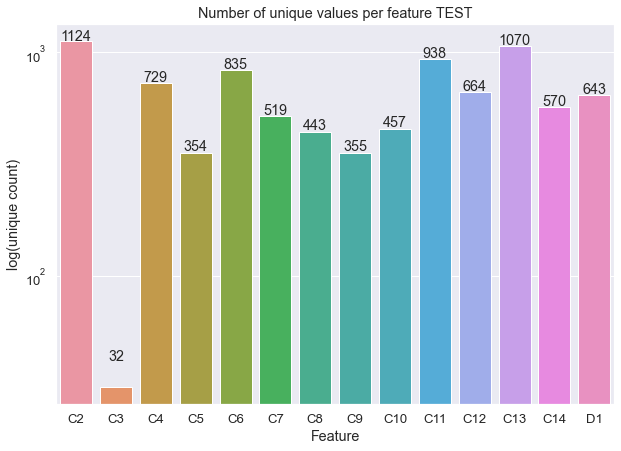

In [169]:
plt.figure(figsize=(10, 7))
c_features = list(test_transaction.columns[16:30])
uniques = [len(test_transaction[col].unique()) for col in c_features]
sns.set(font_scale=1.2)
ax = sns.barplot(c_features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='log(unique count)', title='Number of unique values per feature TEST')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center") 
    #test

## id_code

/Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



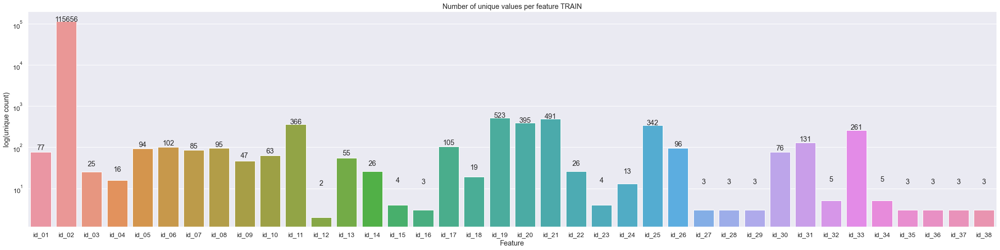

In [170]:
plt.figure(figsize=(35, 8))
features = list(train_identity.columns[0:38])
uniques = [len(train_identity[col].unique()) for col in features]
sns.set(font_scale=1.2)
ax = sns.barplot(features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='log(unique count)', title='Number of unique values per feature TRAIN')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center") 
    #Train

/Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



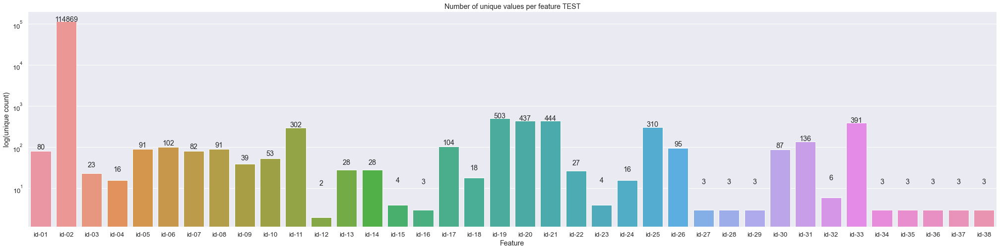

In [171]:
plt.figure(figsize=(35, 8))
features = list(test_identity.columns[0:38])
uniques = [len(test_identity[col].unique()) for col in features]
sns.set(font_scale=1.2)
ax = sns.barplot(features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='log(unique count)', title='Number of unique values per feature TEST')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center") 
    #test

# Categorical 데이터 확인
<Categorical Features>
    
ProductCD
    
emaildomain
    
card1 - card6
    
addr1, addr2
    
P_emaildomain
    
R_emaildomain
    
M1 - M9
    
DeviceType
    
DeviceInfo
    
id_12 - id_38

# 데이터 합치기+ 인코딩
Merge transaction & identity + Label Encoder

In [172]:
train_transaction

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,0,86400,68.50,W,13926,NaN,150.0,discover,142.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987001,0,86401,29.00,W,2755,404.0,150.0,mastercard,102.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987002,0,86469,59.00,W,4663,490.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987003,0,86499,50.00,W,18132,567.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987004,0,86506,50.00,H,4497,514.0,150.0,mastercard,102.0,credit,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3577535,0,15811047,49.00,W,6550,NaN,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3577536,0,15811049,39.50,W,10444,225.0,150.0,mastercard,224.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3577537,0,15811079,30.95,W,12037,595.0,150.0,mastercard,224.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [173]:
%%time
train = train_transaction.merge(train_identity, how='left', left_index=True, right_index=True)
y_train = train['isFraud'].astype("uint8").copy()
print("Tain: ",train.shape)


test = test_transaction.merge(test_identity, how='left', left_index=True, right_index=True)
print("Test: ",test.shape)
print ("Merged!")

Tain:  (590540, 433)
Test:  (506691, 432)
Merged!
CPU times: user 376 ms, sys: 691 ms, total: 1.07 s
Wall time: 1.55 s


In [174]:
print(train)

               isFraud  TransactionDT  TransactionAmt ProductCD  card1  card2  \
TransactionID                                                                   
2987000              0          86400           68.50         W  13926    NaN   
2987001              0          86401           29.00         W   2755  404.0   
2987002              0          86469           59.00         W   4663  490.0   
2987003              0          86499           50.00         W  18132  567.0   
2987004              0          86506           50.00         H   4497  514.0   
...                ...            ...             ...       ...    ...    ...   
3577535              0       15811047           49.00         W   6550    NaN   
3577536              0       15811049           39.50         W  10444  225.0   
3577537              0       15811079           30.95         W  12037  595.0   
3577538              0       15811088          117.00         W   7826  481.0   
3577539              0      

In [175]:
! pip install xgboost
! pip install lightgbm

  Using cached lightgbm-3.3.2.tar.gz (1.5 MB)
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [80 lines of output]
      running bdist_wheel
      /Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/setuptools/command/install.py:34: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
        warnings.warn(
      running build
      running build_py
      creating build
      creating build/lib
      creating build/lib/lightgbm
      copying lightgbm/callback.py -> build/lib/lightgbm
      copying lightgbm/compat.py -> build/lib/lightgbm
      copying lightgbm/plotting.py -> build/lib/lightgbm
      copying lightgbm/__init__.py -> build/lib/lightgbm
      copying lightgbm/engine.py -> build/lib/lightgbm
      copying lightgbm/dask.py -> build/lib/lightgbm
      copying lightgbm/basic.py -> build/lib/

Failed to build lightgbm
  Running setup.py install for lightgbm ... error
  error: subprocess-exited-with-error
  
  × Running setup.py install for lightgbm did not run successfully.
  │ exit code: 1
  ╰─> [39 lines of output]
      running install
      /Users/krc/miniforge3/envs/fastcampus/lib/python3.8/site-packages/setuptools/command/install.py:34: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
        warnings.warn(
      INFO:LightGBM:Starting to compile the library.
      INFO:LightGBM:Starting to compile with CMake.
      Traceback (most recent call last):
        File "/private/var/folders/k6/9x00m_3s16v50p13ww4d8r1m0000gn/T/pip-install-ych3b1dn/lightgbm_e5d384c44b1a43f0b1b19f98b41aa184/setup.py", line 95, in silent_call
          subprocess.check_call(cmd, stderr=log, stdout=log)
        File "/Users/krc/miniforge3/envs/fastcampus/lib/python3.8/subprocess.py", line 364, in check_call
          raise CalledProc

In [176]:
%%time
X_train = train.drop('isFraud', axis=1)
X_test = test.copy()

CPU times: user 940 ms, sys: 3.16 s, total: 4.1 s
Wall time: 5.99 s


In [177]:
#Label Encoding ? key error 남.
# for f in X_train.columns:
#     if X_train[f].dtype=='object' or X_test[f].dtype=='object': 
#         lbl = preprocessing.LabelEncoder()
#         lbl.fit(list(X_train[f].values) + list(X_test[f].values))
#         X_train[f] = lbl.transform(list(X_train[f].values))
#         X_test[f] = lbl.transform(list(X_test[f].values))  

KeyError: 'id_01'

# Drop column

In [178]:
drop_col = ['TransactionDT', 'V300', 'V309', 'V111', 'C3', 'V124', 'V106', 'V125', 'V315', 'V134', 'V102', 'V123', 'V316', 'V113', 'V136', 'V305', 'V110', 'V299', 'V289', 'V286', 'V318', 'V103', 'V304', 'V116', 'V298', 'V284', 'V293', 'V137', 'V295', 'V301', 'V104', 'V311', 'V115', 'V109', 'V119', 'V321', 'V114', 'V133', 'V122', 'V319', 'V105', 'V112', 'V118', 'V117', 'V121', 'V108', 'V135', 'V320', 'V303', 'V297', 'V120']
# drop_col = ['TransactionDT']
X_train.drop(drop_col,axis=1, inplace=True)
X_test.drop(drop_col, axis=1, inplace=True)
X_train.head()

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,68.5,4,13926,NaN,150.0,1,142.0,1,315.0,87.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987001,29.0,4,2755,404.0,150.0,2,102.0,1,325.0,87.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987002,59.0,4,4663,490.0,150.0,4,166.0,2,330.0,87.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987003,50.0,4,18132,567.0,150.0,2,117.0,2,476.0,87.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987004,50.0,1,4497,514.0,150.0,2,102.0,1,420.0,87.0,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M


# Fill nan

In [179]:
X_train.fillna(-1,inplace=True)
X_test.fillna(-1,inplace=True)
X_train.head()

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,68.5,4,13926,-1.0,150.0,1,142.0,1,315.0,87.0,...,-1,-1.0,-1,-1,-1,-1,-1,-1,-1,-1
2987001,29.0,4,2755,404.0,150.0,2,102.0,1,325.0,87.0,...,-1,-1.0,-1,-1,-1,-1,-1,-1,-1,-1
2987002,59.0,4,4663,490.0,150.0,4,166.0,2,330.0,87.0,...,-1,-1.0,-1,-1,-1,-1,-1,-1,-1,-1
2987003,50.0,4,18132,567.0,150.0,2,117.0,2,476.0,87.0,...,-1,-1.0,-1,-1,-1,-1,-1,-1,-1,-1
2987004,50.0,1,4497,514.0,150.0,2,102.0,1,420.0,87.0,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
